In [1]:
import cv2
import math
import glob
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
def read_image(path, shape=(256, 256)):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, dsize=shape)
    return img

In [3]:
paths = glob.glob('imagens_originais/*.jpg')
paths

['data/math7-p-107t0.jpg',
 'data/math1-p-169t0.jpg',
 'data/real1-p-169t0.jpg',
 'data/real9-p-15t0.jpg',
 'data/image.jpg',
 'data/math11-p-46t0.jpg']

In [5]:
image_orig = np.array([read_image(path=path) for path in paths])
image_orig.shape

(6, 256, 256, 3)

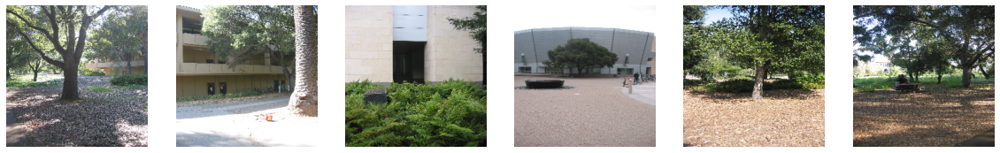

In [64]:
plt.figure(figsize=(20,5))
for i in range(len(image_orig)):
    plt.subplot(1,6,i+1)
    plt.imshow(image_orig[i])
    plt.axis('off')
#     plt.title(f'Imagem Original {i}')
plt.savefig(fname='imagens_medium/imagem_original.png', 
            dpi=300, 
             bbox_inches='tight',
            transparent=True)
plt.show()

# Exemplo de Rotação de Imagem usando o `ImageDataGenerator`

O ImageDataGenerator permite que você defina uma série de transformações para serem aplicadas às imagens durante o treinamento. Isso pode incluir rotações, ampliações, cortes, zoom, inversão horizontal, entre outras opções. Você pode definir essas transformações por meio de parâmetros como `rotation_range`, `width_shift_range`, `height_shift_range`, `zoom_range`, `horizontal_flip`, entre outros.

Além disso, o ImageDataGenerator permite escolher um fill_mode para preencher as áreas vazias resultantes da rotação ou outras transformações. Existem quatro opções disponíveis:
* constant
* nearest
* reflect 
* wrap

In [69]:
def plot_imagem_orig_and_transform(image_orig, datagen, save=False, fname='imagem_transformada'):
    fig, ax = plt.subplots(nrows=2, ncols=len(image_orig), figsize=(20,6))
    for i, img in enumerate(image_orig):
        img_transformed = datagen.random_transform(img)    
        ax[0,i].imshow(img)
        ax[0,i].axis('off')
        ax[1,i].imshow(img_transformed)
        ax[1,i].axis('off')
        if i == 0:
            ax[0,i].set_title('Imagem Original')
            ax[1,i].set_title('Imagem Transformada')
    if save:
        plt.savefig(
            fname=f'imagens_medium/{fname}.png', 
            dpi=300, 
             bbox_inches='tight',
            transparent=True)
    plt.show()

In [66]:
### Parâmetros ###

# Definindo a rotação máxima
rotation_range = 30

# Fração do deslocamento na vertical e horizontal
fraction = 0.2

## `fill_mode` = constant e `cval` = 1

> Preenche com um valor constante especificado pelo parâmetro cval

In [67]:
# fill mode
fill_mode = 'constant'
cval = 1.0

### Rotação

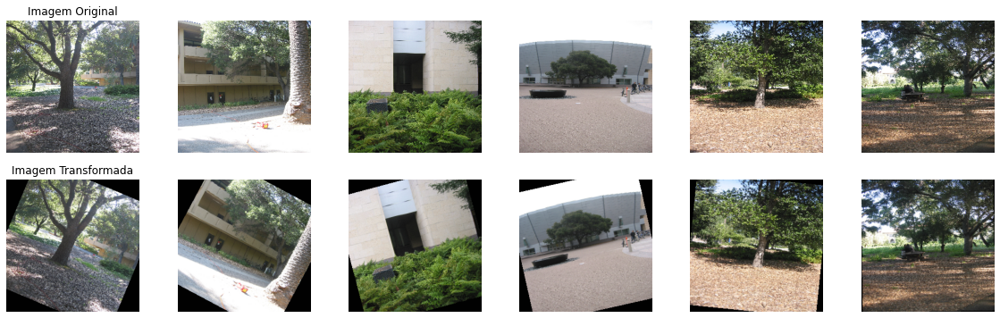

In [68]:
# Definindo o gerador de imagem
datagen = ImageDataGenerator(rotation_range=rotation_range, 
                             fill_mode=fill_mode, cval=cval)

plot_imagem_orig_and_transform(image_orig, datagen, save=True, fname='imagem_transformada_constant')

### Translação

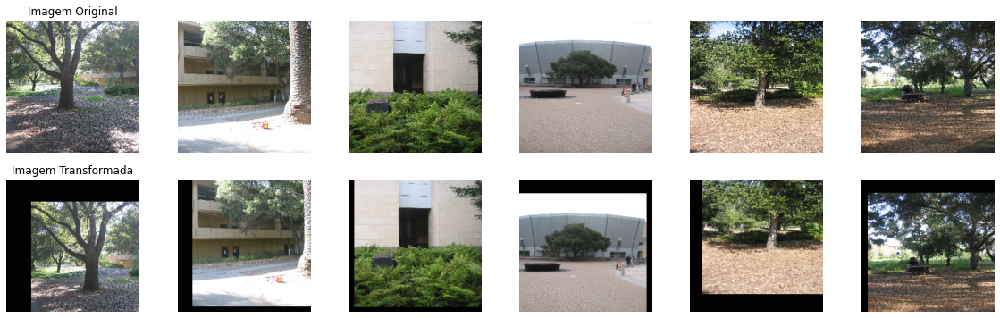

In [70]:
# Definindo o gerador de imagem
datagen = ImageDataGenerator(width_shift_range = fraction, 
                             height_shift_range = fraction, 
                             fill_mode=fill_mode, cval=cval)

plot_imagem_orig_and_transform(image_orig, datagen)

### Rotação e Translação

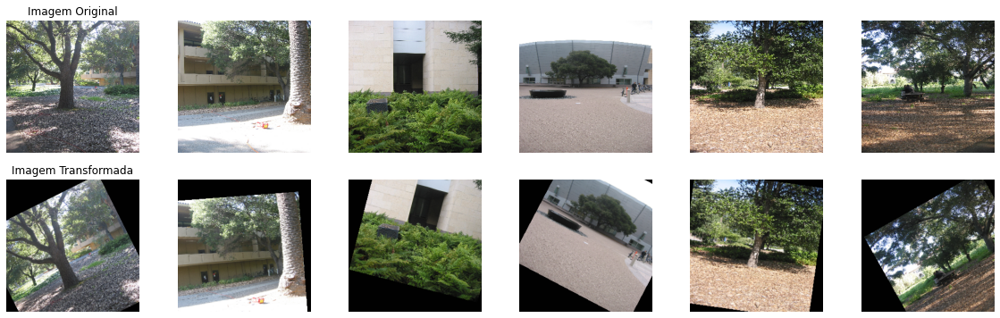

In [71]:
# Definindo o gerador de imagem
datagen = ImageDataGenerator(rotation_range=rotation_range, 
                             width_shift_range = fraction, 
                             height_shift_range = fraction, 
                             fill_mode=fill_mode, cval=cval)

plot_imagem_orig_and_transform(image_orig, datagen)

## `fill_mode` = nearest

>  Preenche com o valor do pixel mais próximo

In [73]:
# fill mode
fill_mode = 'nearest'

### Rotação

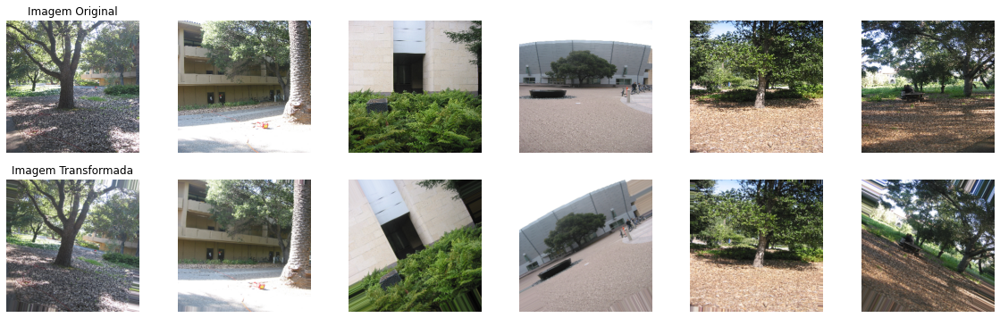

In [76]:
# Definindo o gerador de imagem
datagen = ImageDataGenerator(rotation_range=rotation_range, 
                             fill_mode=fill_mode)

plot_imagem_orig_and_transform(image_orig, datagen, save=True, fname='imagem_transformada_nearest')

### Translação

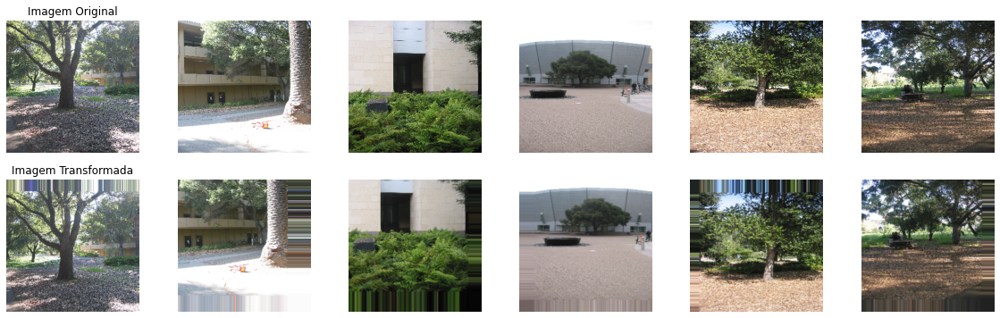

In [47]:
# Definindo o gerador de imagem
datagen = ImageDataGenerator(width_shift_range = fraction, 
                             height_shift_range = fraction, 
                             fill_mode=fill_mode)

plot_imagem_orig_and_transform(image_orig, datagen)

### Rotação e Translação

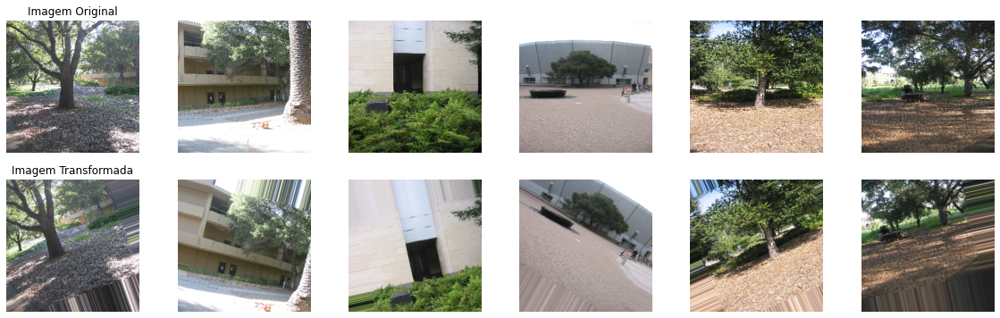

In [48]:
# Definindo o gerador de imagem
datagen = ImageDataGenerator(rotation_range=rotation_range, 
                             width_shift_range = fraction, 
                             height_shift_range = fraction, 
                             fill_mode=fill_mode)

plot_imagem_orig_and_transform(image_orig, datagen)

## `fill_mode` = reflect

> Reflete a imagem em relação à borda da imagem

In [77]:
# fill mode
fill_mode = 'reflect'

### Rotação

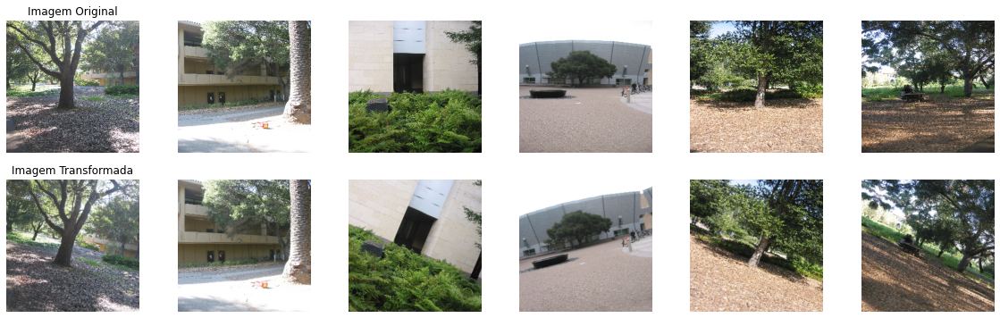

In [78]:
# Definindo o gerador de imagem
datagen = ImageDataGenerator(rotation_range=rotation_range, 
                             fill_mode=fill_mode)

plot_imagem_orig_and_transform(image_orig, datagen, save=True, fname='imagem_transformada_reflect')

### Translação

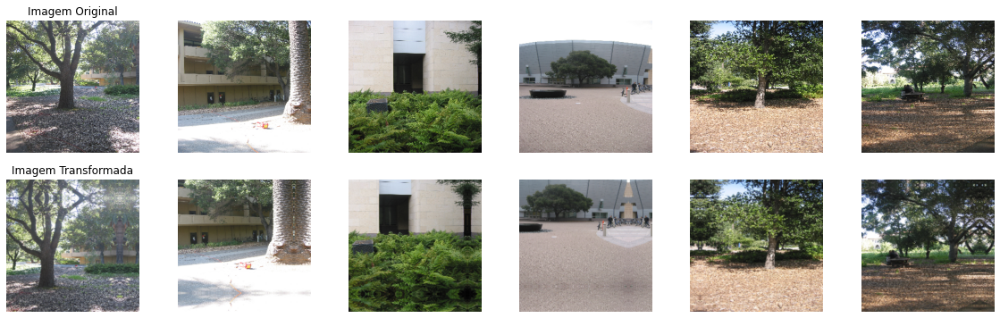

In [51]:
# Definindo o gerador de imagem
datagen = ImageDataGenerator(width_shift_range = fraction, 
                             height_shift_range = fraction, 
                             fill_mode=fill_mode)

plot_imagem_orig_and_transform(image_orig, datagen)

### Rotação e Translação

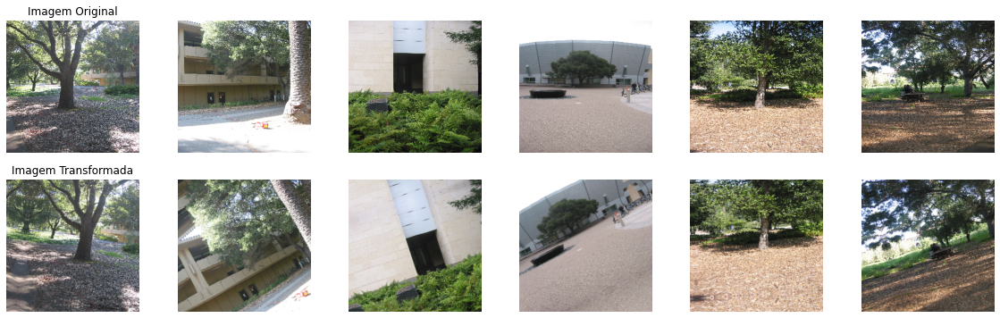

In [52]:
# Definindo o gerador de imagem
datagen = ImageDataGenerator(rotation_range=rotation_range, 
                             width_shift_range = fraction, 
                             height_shift_range = fraction, 
                             fill_mode=fill_mode)

plot_imagem_orig_and_transform(image_orig, datagen)

## `fill_mode` = wrap

>  Envolve a imagem para preencher as áreas vazias

In [79]:
# fill mode
fill_mode = 'wrap'

### Rotação

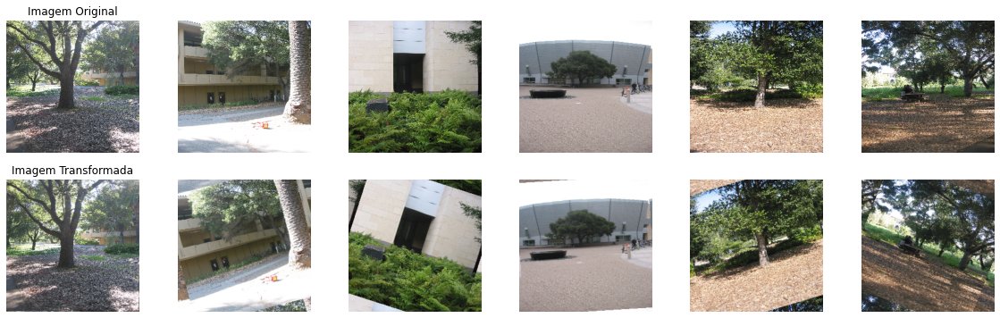

In [80]:
# Definindo o gerador de imagem
datagen = ImageDataGenerator(rotation_range=rotation_range, 
                             fill_mode=fill_mode)

plot_imagem_orig_and_transform(image_orig, datagen, save=True, fname='imagem_transformada_wrap')

### Translação

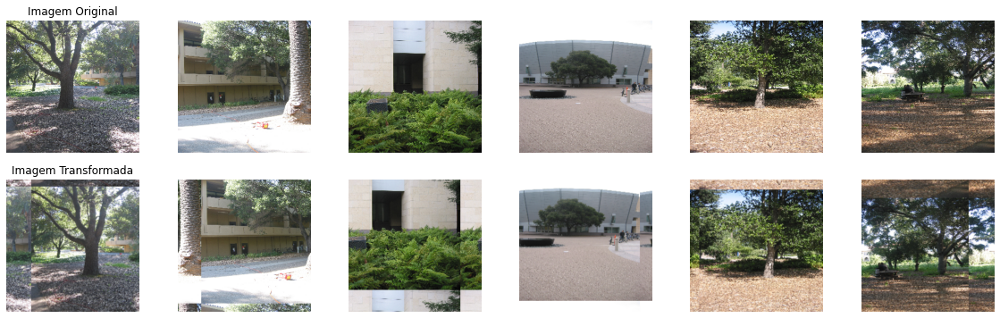

In [55]:
# Definindo o gerador de imagem
datagen = ImageDataGenerator(width_shift_range = fraction, 
                             height_shift_range = fraction, 
                             fill_mode=fill_mode)

plot_imagem_orig_and_transform(image_orig, datagen)

### Rotação e Translação

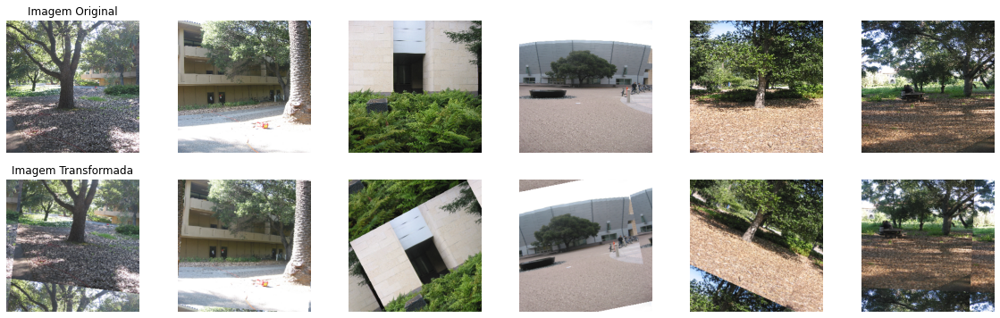

In [56]:
# Definindo o gerador de imagem
datagen = ImageDataGenerator(rotation_range=rotation_range, 
                             width_shift_range = fraction, 
                             height_shift_range = fraction, 
                             fill_mode=fill_mode)

plot_imagem_orig_and_transform(image_orig, datagen)

# Rotação e recorte de imagens usando Opencv

Uma alternativa é aplicar a rotação na imagem e recortar a área na qual foi manipulado no preenchimento de áreas vazias. 
O código abaixo define três funções para manipulação de imagens utilizando a biblioteca OpenCV em Python:

1. `rotate_image(image, angle)`: recebe uma imagem e um ângulo (em graus), e rotaciona a imagem sobre seu centro. A função retorna a imagem resultante, que terá tamanho suficiente para conter a imagem rotacionada inteira, com fundo preto.
2. `largest_rotated_rect(w, h, angle)`: dadas as dimensões de um retângulo e um ângulo de rotação em radianos, calcula as dimensões do maior retângulo possível que pode ser encaixado dentro do retângulo rotacionado.
3. `crop_around_center(image, width, height)`: dada uma imagem, corta uma região retangular em torno de seu centro com as dimensões especificadas pelos argumentos `width` e `height`. Retorna a região cortada.

Por fim, a função `rotate_crop_resize_image(image, angle)` combina as três funções anteriores para aplicar uma rotação com o ângulo especificado, cortar uma região retangular centrada na imagem resultante com as dimensões do maior retângulo possível e, por fim, redimensionar a imagem para as dimensões especificadas (também em pixels). Retorna a imagem resultante.

In [81]:
def rotate_image(image, angle):
    """
    Rotates an OpenCV 2 / NumPy image about it's centre by the given angle
    (in degrees). The returned image will be large enough to hold the entire
    new image, with a black background
    """

    # Get the image size
    # No that's not an error - NumPy stores image matricies backwards
    image_size = (image.shape[1], image.shape[0])
    image_center = tuple(np.array(image_size) / 2)

    # Convert the OpenCV 3x2 rotation matrix to 3x3
    rot_mat = np.vstack(
        [cv2.getRotationMatrix2D(image_center, angle, 1.0), [0, 0, 1]]
    )

    rot_mat_notranslate = np.matrix(rot_mat[0:2, 0:2])

    # Shorthand for below calcs
    image_w2 = image_size[0] * 0.5
    image_h2 = image_size[1] * 0.5

    # Obtain the rotated coordinates of the image corners
    rotated_coords = [
        (np.array([-image_w2,  image_h2]) * rot_mat_notranslate).A[0],
        (np.array([ image_w2,  image_h2]) * rot_mat_notranslate).A[0],
        (np.array([-image_w2, -image_h2]) * rot_mat_notranslate).A[0],
        (np.array([ image_w2, -image_h2]) * rot_mat_notranslate).A[0]
    ]

    # Find the size of the new image
    x_coords = [pt[0] for pt in rotated_coords]
    x_pos = [x for x in x_coords if x > 0]
    x_neg = [x for x in x_coords if x < 0]

    y_coords = [pt[1] for pt in rotated_coords]
    y_pos = [y for y in y_coords if y > 0]
    y_neg = [y for y in y_coords if y < 0]

    right_bound = max(x_pos)
    left_bound = min(x_neg)
    top_bound = max(y_pos)
    bot_bound = min(y_neg)

    new_w = int(abs(right_bound - left_bound))
    new_h = int(abs(top_bound - bot_bound))

    # We require a translation matrix to keep the image centred
    trans_mat = np.matrix([
        [1, 0, int(new_w * 0.5 - image_w2)],
        [0, 1, int(new_h * 0.5 - image_h2)],
        [0, 0, 1]
    ])

    # Compute the tranform for the combined rotation and translation
    affine_mat = (np.matrix(trans_mat) * np.matrix(rot_mat))[0:2, :]

    # Apply the transform
    result = cv2.warpAffine(
        image,
        affine_mat,
        (new_w, new_h),
        flags=cv2.INTER_LINEAR
    )

    return result


def largest_rotated_rect(w, h, angle):
    """
    Given a rectangle of size wxh that has been rotated by 'angle' (in
    radians), computes the width and height of the largest possible
    axis-aligned rectangle within the rotated rectangle.

    Original JS code by 'Andri' and Magnus Hoff from Stack Overflow

    Converted to Python by Aaron Snoswell
    """

    quadrant = int(math.floor(angle / (math.pi / 2))) & 3
    sign_alpha = angle if ((quadrant & 1) == 0) else math.pi - angle
    alpha = (sign_alpha % math.pi + math.pi) % math.pi

    bb_w = w * math.cos(alpha) + h * math.sin(alpha)
    bb_h = w * math.sin(alpha) + h * math.cos(alpha)

    gamma = math.atan2(bb_w, bb_w) if (w < h) else math.atan2(bb_w, bb_w)

    delta = math.pi - alpha - gamma

    length = h if (w < h) else w

    d = length * math.cos(alpha)
    a = d * math.sin(alpha) / math.sin(delta)

    y = a * math.cos(gamma)
    x = y * math.tan(gamma)

    return (
        bb_w - 2 * x,
        bb_h - 2 * y
    )


def crop_around_center(image, width, height):
    """
    Given a NumPy / OpenCV 2 image, crops it to the given width and height,
    around it's centre point
    """

    image_size = (image.shape[1], image.shape[0])
    image_center = (int(image_size[0] * 0.5), int(image_size[1] * 0.5))

    if(width > image_size[0]):
        width = image_size[0]

    if(height > image_size[1]):
        height = image_size[1]

    x1 = int(image_center[0] - width * 0.5)
    x2 = int(image_center[0] + width * 0.5)
    y1 = int(image_center[1] - height * 0.5)
    y2 = int(image_center[1] + height * 0.5)

    return image[y1:y2, x1:x2]

def rotate_crop_resize_image(image, angle):
    image_height, image_width = image.shape[:2]
    image_orig = image.copy()
    image_rotated = rotate_image(image_orig, angle)
    image_rotated_cropped = crop_around_center(
        image_rotated,
        *largest_rotated_rect(
            image_width,
            image_height,
            np.radians(angle)
        )
    )
    image_rotated_cropped_resize = cv2.resize(image_rotated_cropped, 
                                              dsize=(image_height, image_width))
    return image_rotated_cropped_resize

## Exemplo 1

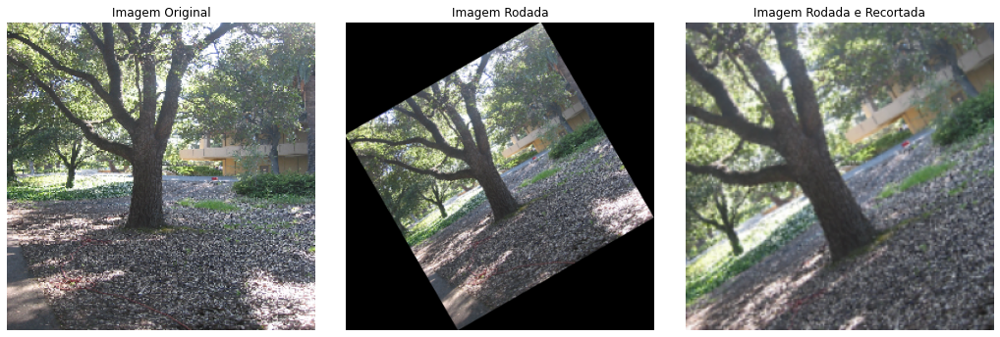

In [97]:
# Definindo a rotação em graus
angle = 30.0
# Coletando as dimensões da imagem original
image_height, image_width = image_orig[0].shape[0:2]
# Rotação
image_rotated = rotate_image(image_orig[0], angle)
# Recorte da imagem
image_rotated_cropped = crop_around_center(
    image_rotated,
    *largest_rotated_rect(
        image_width,
        image_height,
        np.radians(angle)
    )
)
# Redimencionando imagem em relação as dimensões do tamanho da imagem original
image_rotated_cropped_resize = cv2.resize(image_rotated_cropped, 
                                          dsize=(image_height, image_width))
# Plot Imagens
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18,6))
title = ['Imagem Original', 'Imagem Rodada', 'Imagem Rodada e Recortada']
for i, im in enumerate([image_orig[0], 
                        image_rotated, 
                        image_rotated_cropped_resize]):
    ax[i].imshow(im)
    ax[i].set_title(title[i])
    ax[i].axis('off')
plt.subplots_adjust(wspace=0.1, hspace=-0.2)
plt.savefig(fname='imagens_medium/exemplo_01.png', 
            dpi=300, 
            bbox_inches='tight',
            transparent=True)
plt.show()

## Exemplo 2

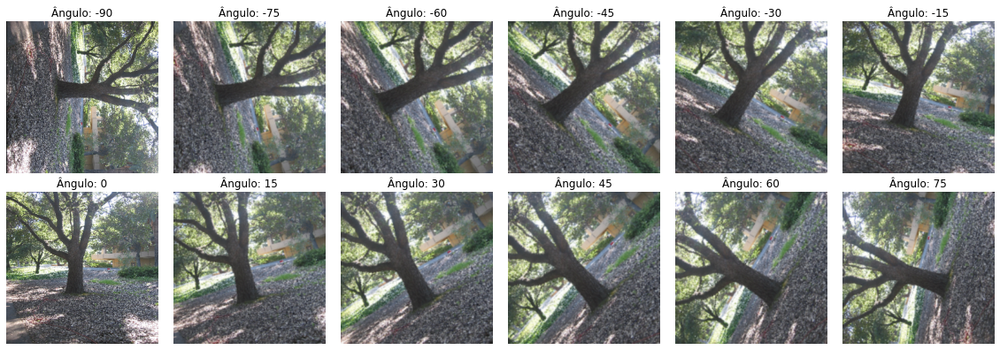

In [95]:
# Definindo a rotação em graus
angles = np.arange(-90, 90, step=15)

# Imagens Transformada
image_transform = [rotate_crop_resize_image(image_orig[0], angle) for angle in angles]

# Plot das Imagens Geradas
nrows, ncols = 2, 6
total = nrows * ncols
plt.figure(figsize=(20,8))
for i in range(total):
    plt.subplot(nrows, ncols, i+1)
    plt.imshow(image_transform[i])
    plt.title(f"Ângulo: {angles[i]}")
    plt.axis('off')
plt.subplots_adjust(wspace=0.1, hspace=-0.2)
# plt.savefig('exemplo_02.png')
plt.savefig(fname='imagens_medium/exemplo_02.png', 
            dpi=300, 
            bbox_inches='tight',
            transparent=True)
plt.show()